### Radwa Yahia

---



## Image Classification Project: Rugby vs. Soccer

The project focused on image classification of rugby and soccer images. A total of 3058 images were collected and split into train and test sets using an 80-20 ratio. The training set comprises 2448 images, while the test set comprises 610 images. Both classes, rugby, and soccer, have 1224 images each in both the training and test sets, ensuring a balanced dataset.

https://www.kaggle.com/datasets/ligtfeather/football-vs-rugby-image-classification

1- Data Connection

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


2- Import Libraries

In [2]:
import matplotlib.pyplot as plt
import seaborn as sns

import keras
from keras.models import Sequential
from keras.layers import Dense, Conv2D , MaxPool2D , Flatten , Dropout
from keras.preprocessing.image import ImageDataGenerator
from keras.optimizers import Adam

from google.colab.patches import cv2_imshow
from sklearn.metrics import classification_report,confusion_matrix

import tensorflow as tf
import math
from pathlib import Path
import pickle
import cv2
import os


import numpy as np

3- Read Data

In [3]:
import os

def count_classes_and_images(dataset_path):
    classes = os.listdir(dataset_path)
    class_counts = {}

    for class_name in classes:
        if os.path.isdir(os.path.join(dataset_path, class_name)):
            images = os.listdir(os.path.join(dataset_path, class_name))
            class_counts[class_name] = len(images)

    num_classes = len(class_counts)

    return num_classes, class_counts

# Example usage
dataset_path = "/content/drive/MyDrive/Pattern/train"
num_classes, class_counts = count_classes_and_images(dataset_path)
print("Number of classes:", num_classes)
print("Number of images in each class:")
for class_name, count in class_counts.items():
    print(f"{class_name}: {count} images")


Number of classes: 2
Number of images in each class:
rugby: 1233 images
soccer: 366 images


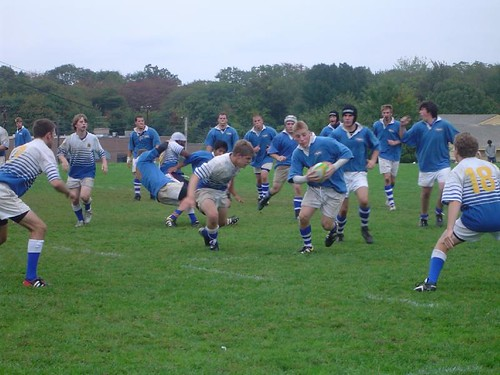

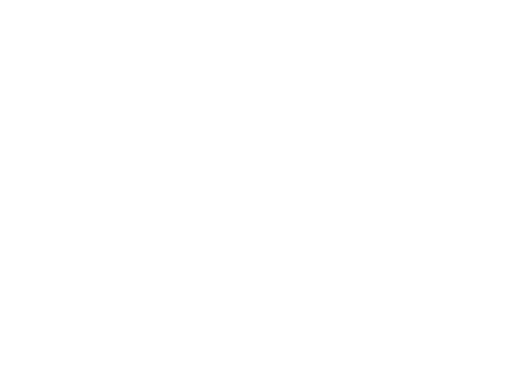

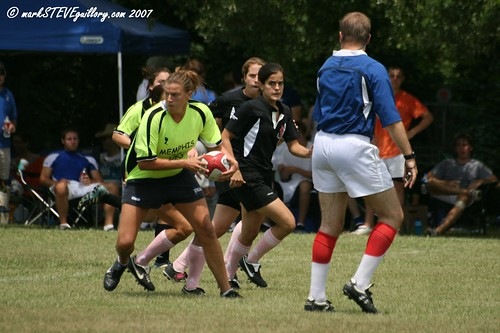

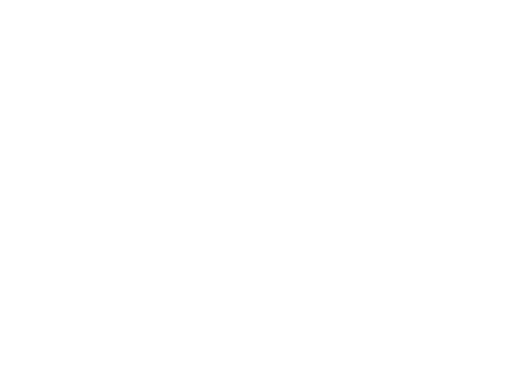

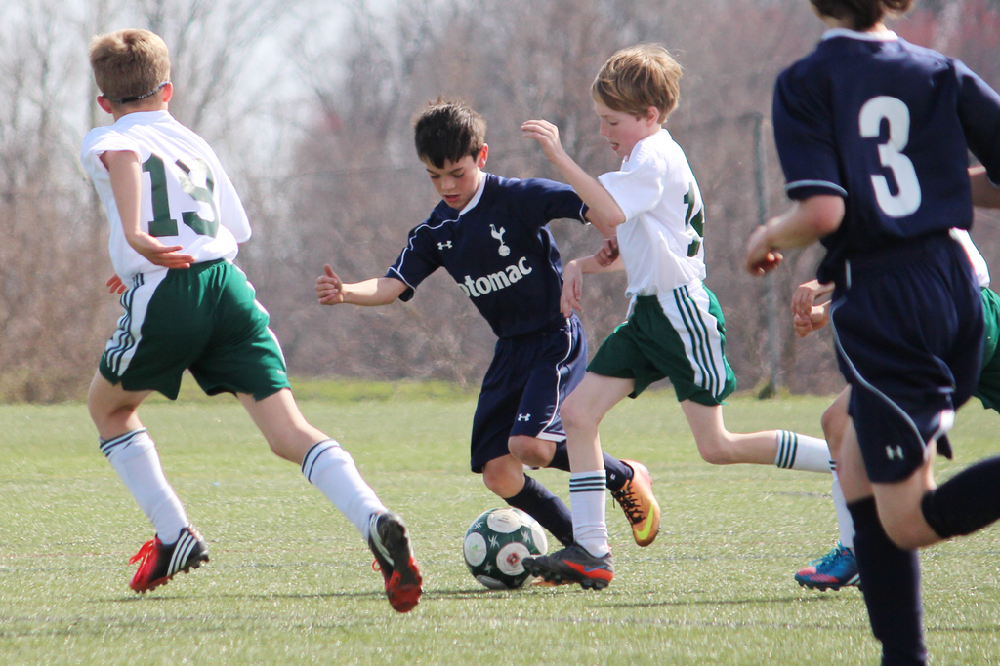

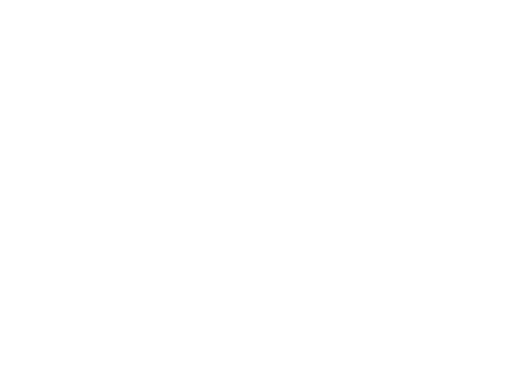

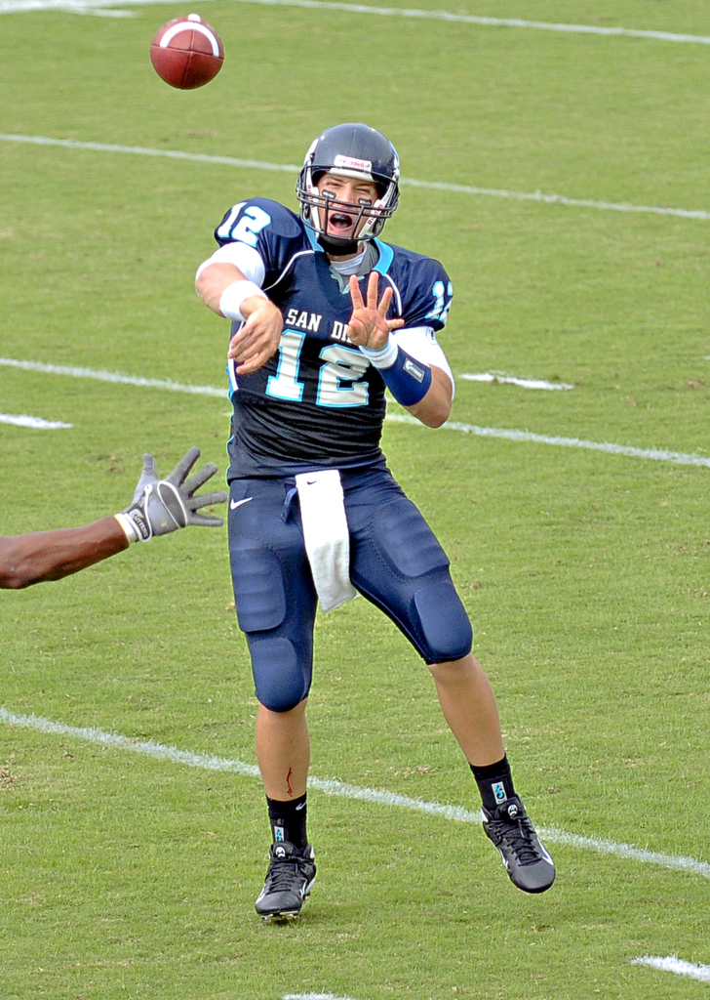

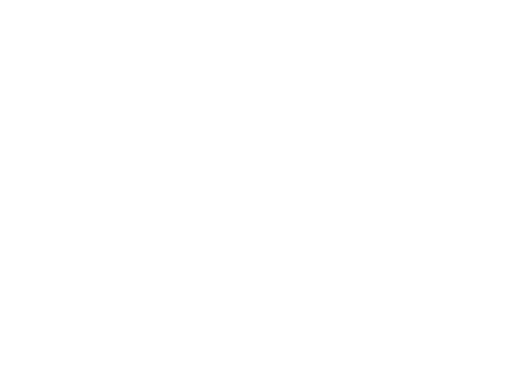

In [4]:
import cv2
import os


DATADIR="/content/drive/MyDrive/Pattern/train"
CATEGORIES=["rugby","soccer"]
for category in CATEGORIES:
  path=os.path.join(DATADIR,category)
  x=0
  for img in os.listdir(path):
    x+=1
    img_array=cv2.imread(os.path.join(path,img))
    cv2_imshow(img_array)
    plt.axis('off')
    plt.show()
    if x==2 :
      break

## 4- Preprocessing

Brightness

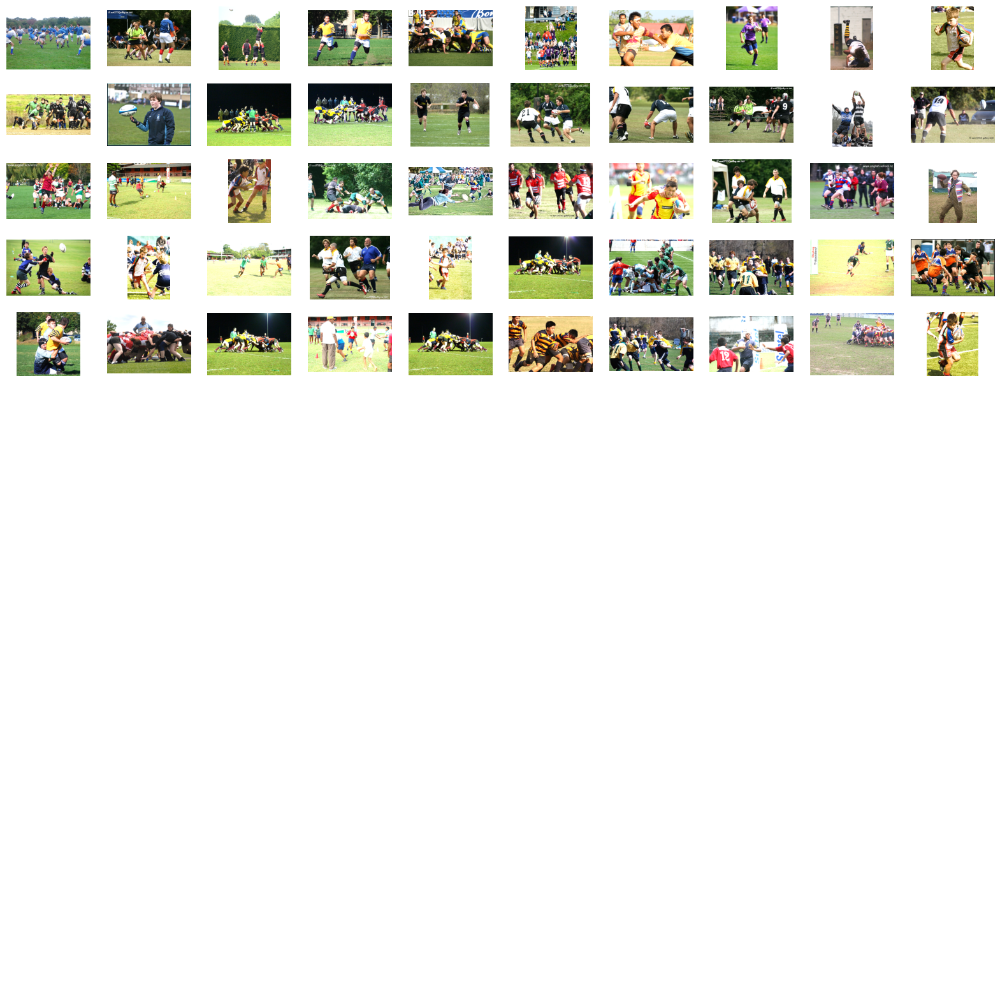

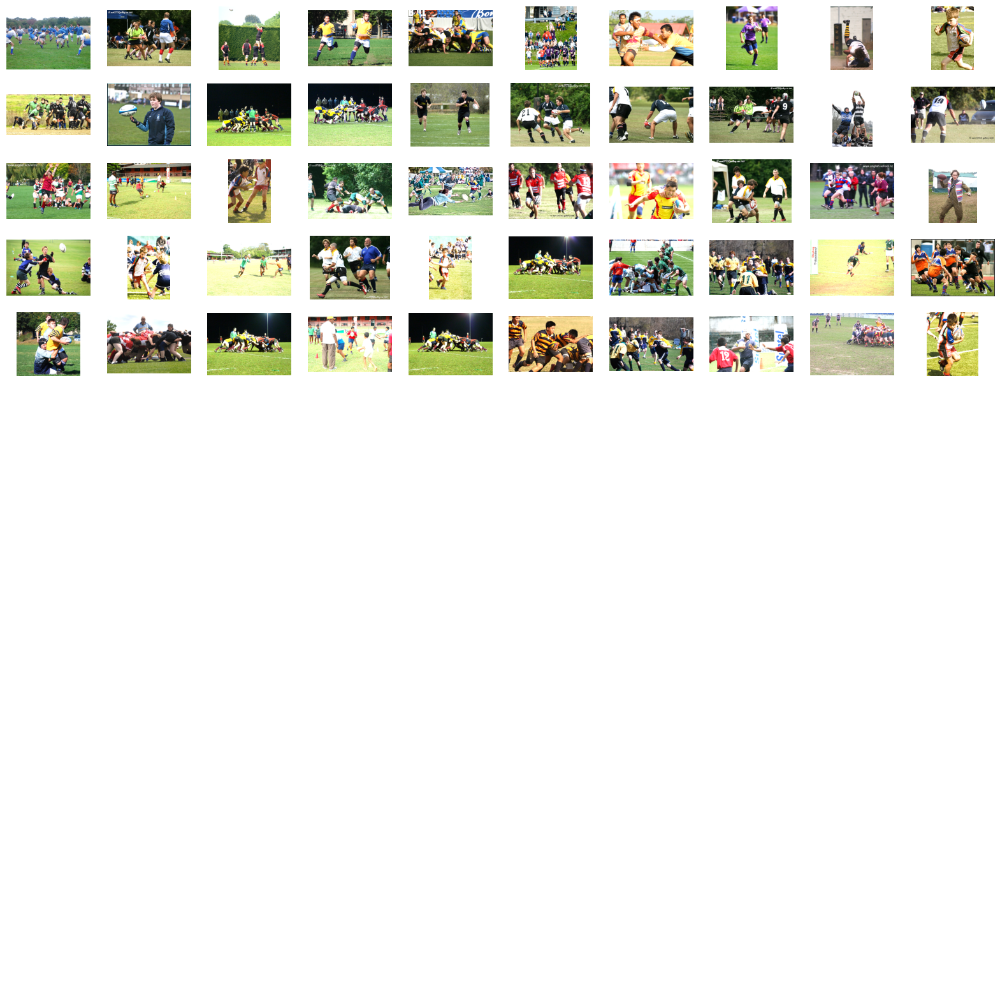

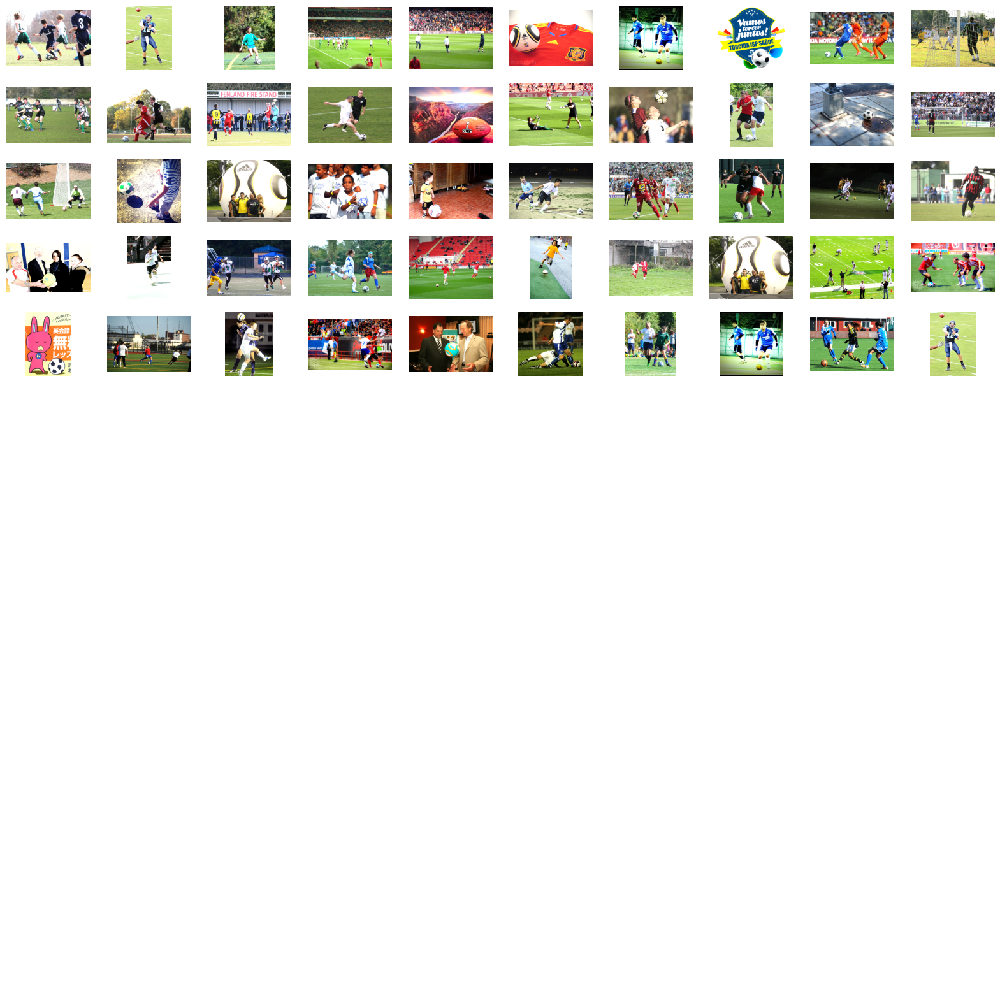

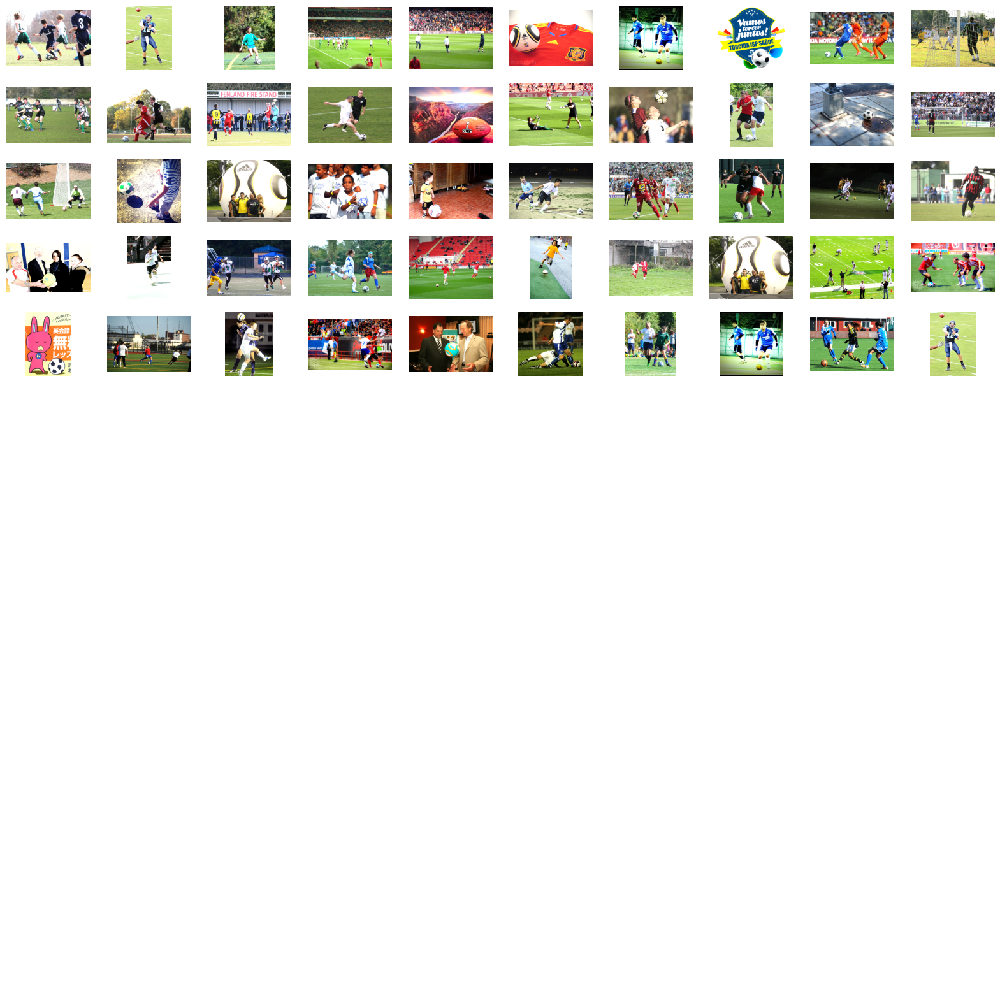

In [6]:
from PIL.ImageEnhance import Brightness
import cv2
import os
import matplotlib.pyplot as plt
import numpy as np

DATADIR="/content/drive/MyDrive/Pattern/train"
CATEGORIES=["rugby","soccer"]
for category in CATEGORIES:
  path=os.path.join(DATADIR,category)
  x=0
  for img in os.listdir(path):
    x+=1
    img_array=cv2.imread(os.path.join(path,img))
    image_files=os.listdir(path)
    num_images=50
    num_rows=(num_images//4)+1
    num_cols=10
    fig,axes=plt.subplots(nrows=num_rows,ncols=num_cols,figsize=(20,20))
    brightness_level=30
    for i,ax in enumerate(axes.flatten()):
      if i<num_images:
        img=cv2.imread(os.path.join(path,image_files[i]))
        img=cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
        img_bright=cv2.addWeighted(img,1+brightness_level/100,img,0,0)
        ax.imshow(img_bright)
        ax.axis('off')
      else:
        ax.axis('off')
    if x==2 :
      break

Resize

Showing images from category: rugby


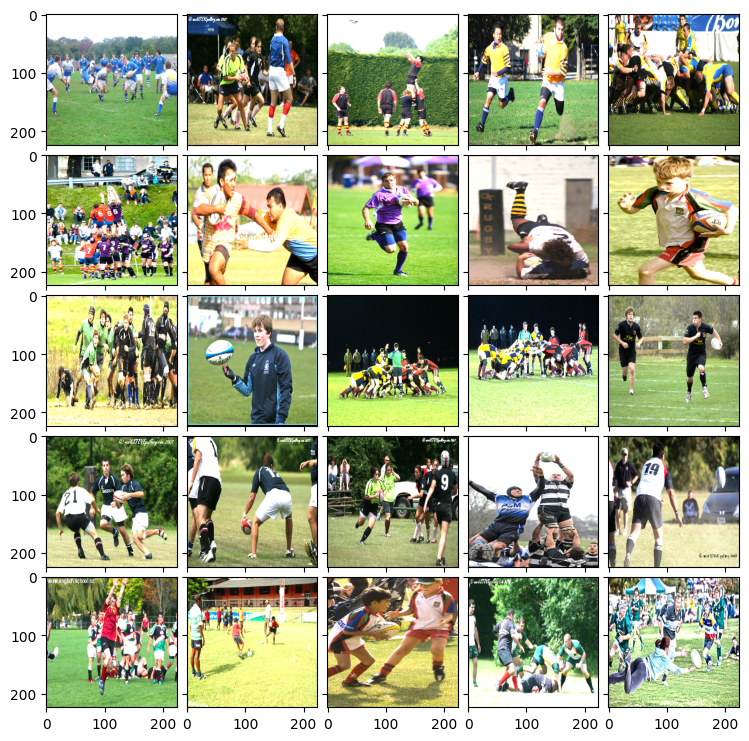

Showing images from category: soccer


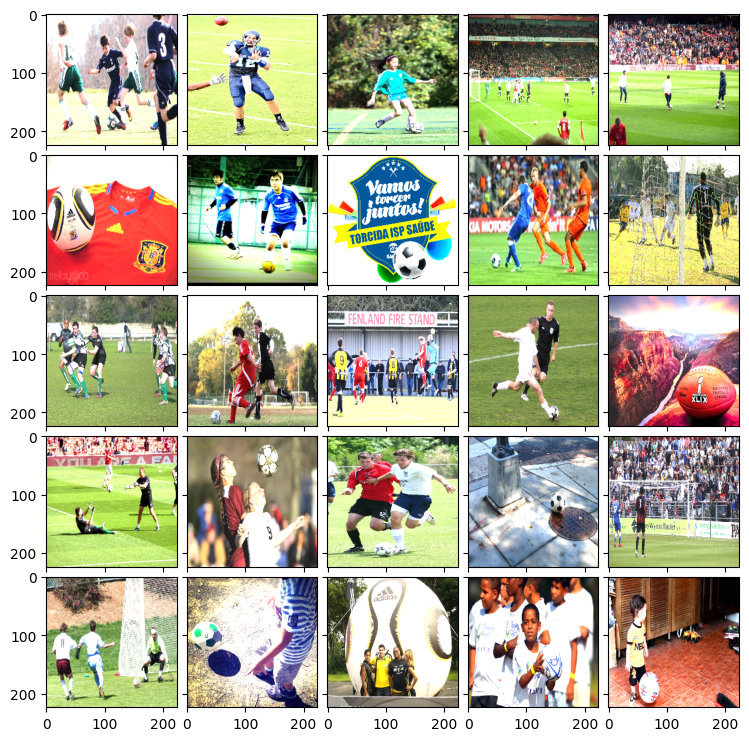

In [16]:
import cv2
import os
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import ImageGrid

def show_image_grid(imgs, grid_size=(1, 1), resize_shape=None):
    fig = plt.figure(figsize=(9., 9.))
    grid = ImageGrid(fig, 111, # similar to subplot(111)
                     nrows_ncols=grid_size, # creates grid of axes
                     axes_pad=0.1, # pad between axes in inch.
                     )
    for ax, im in zip(grid, imgs):
        if resize_shape is not None:
            im = cv2.resize(im, resize_shape)
        ax.imshow(im)

train_dir = "/content/drive/MyDrive/Pattern/train"
resize_shape = (224, 224) # set the desired size of the images

for category in os.listdir(train_dir):
    category_dir = os.path.join(train_dir, category)
    if os.path.isdir(category_dir):
        print('Showing images from category:', category)
        images = []
        for image_filename in os.listdir(category_dir):
            image_path = os.path.join(category_dir, image_filename)
            image = cv2.imread(image_path)
            image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB) # convert to RGB
            if resize_shape is not None:
                image = cv2.resize(image, resize_shape)
            # apply contrast
            alpha = 1.5 # contrast control (1.0-3.0)
            beta = 0    # brightness control (0-100)
            image = cv2.convertScaleAbs(image, alpha=alpha, beta=beta)
            images.append(image)
        show_image_grid(images, grid_size=(5, 5), resize_shape=resize_shape)
        plt.show()

##  Feature Extraction Technique

Canny

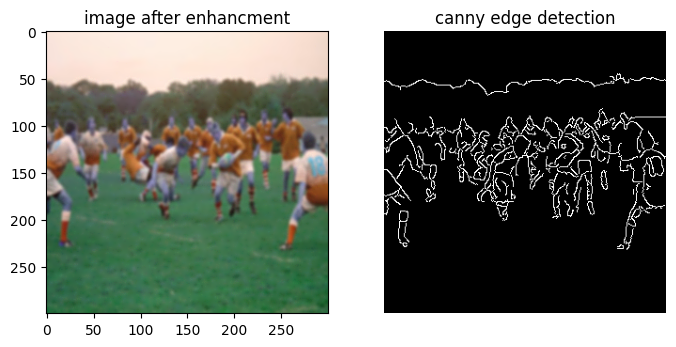

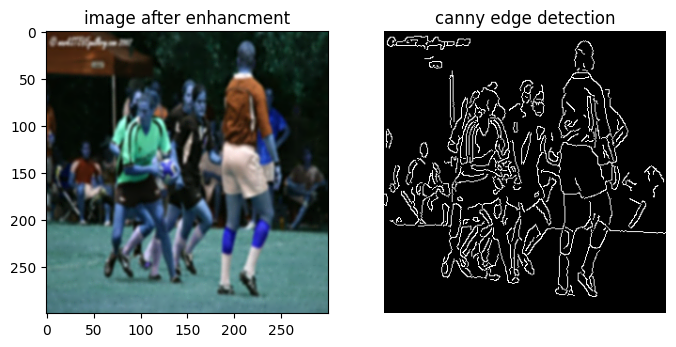

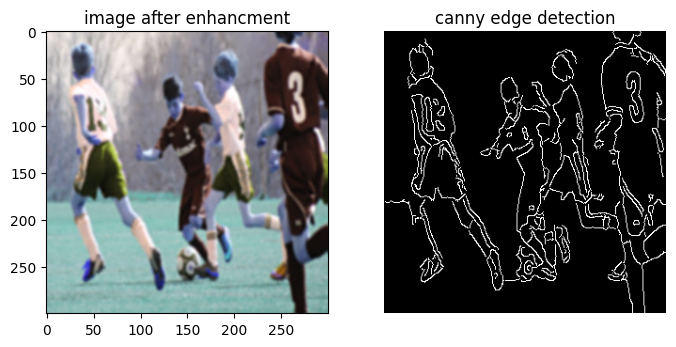

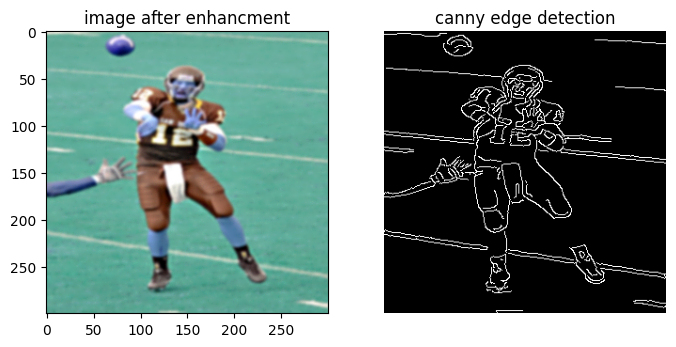

In [17]:
import numpy as np
import cv2
import os
import matplotlib.pyplot as plt
from PIL import ImageEnhance
from skimage import filters
from PIL import ImageOps
from skimage import feature
from PIL import Image
from mpl_toolkits.axes_grid1 import ImageGrid

DATADIR="/content/drive/MyDrive/Pattern/train"
CATEGORIES=["rugby","soccer"]
IMG_SIZE =(300,300)
for category in CATEGORIES:
  x=0
  path=os.path.join(DATADIR,category)

  for img in os.listdir(path):
    x+=1
    img_array=cv2.imread(os.path.join(path,img))
    img_array =cv2.resize(img_array,IMG_SIZE)
    img_array=cv2.GaussianBlur(img_array,(9,9),0)
    pil_image=Image.fromarray(img_array)
    enhancer = ImageEnhance.Sharpness(pil_image)
    sharp_image=enhancer.enhance(6.0)
    img_array=cv2.cvtColor(np.array(sharp_image),cv2.COLOR_RGB2BGR)
    edges=cv2.Canny(img_array,100,200)
    fig,axes=plt.subplots(1,2,figsize=(8,4))
    axes[0].imshow(cv2.cvtColor(img_array,cv2.COLOR_BGR2RGB))
    axes[0].set_title('image after enhancment')
    axes[1].imshow(edges,cmap='gray')
    axes[1].set_title('canny edge detection')
    plt.axis('off')
    plt.show()

    if x==2 :
      break

## Sift

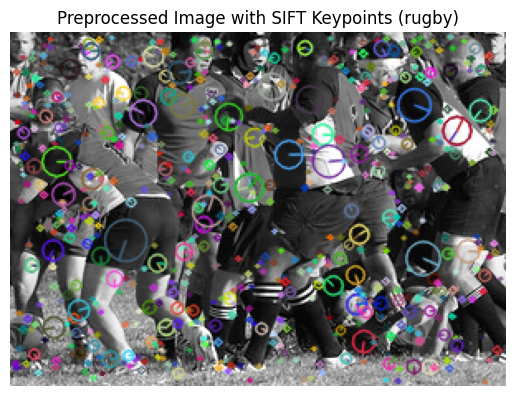

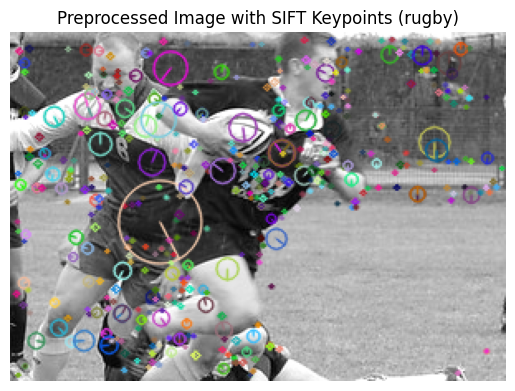

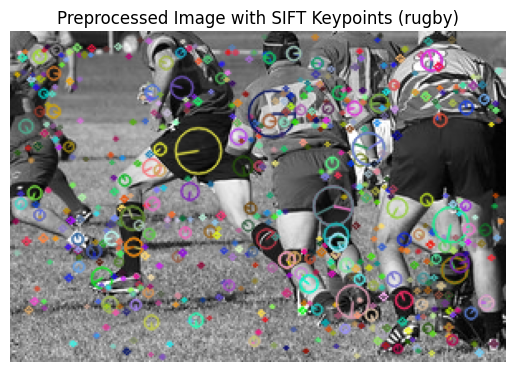

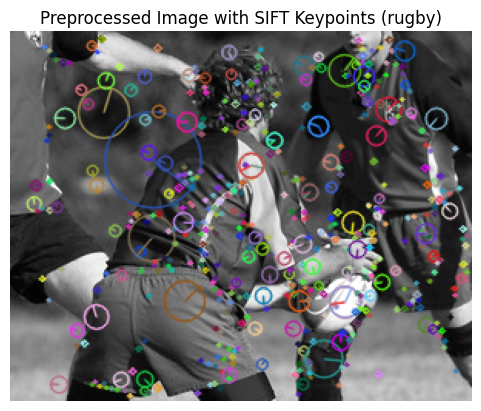

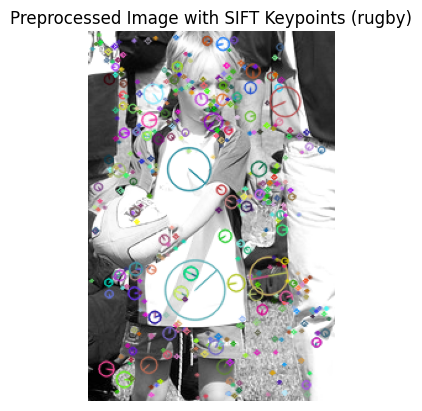

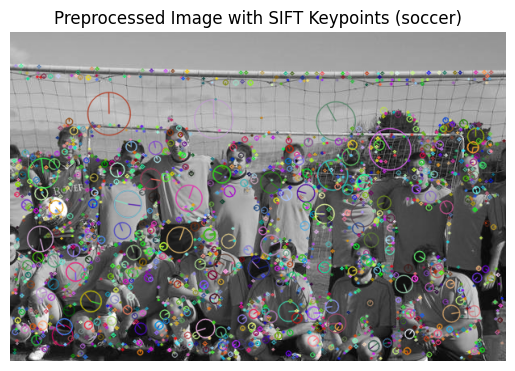

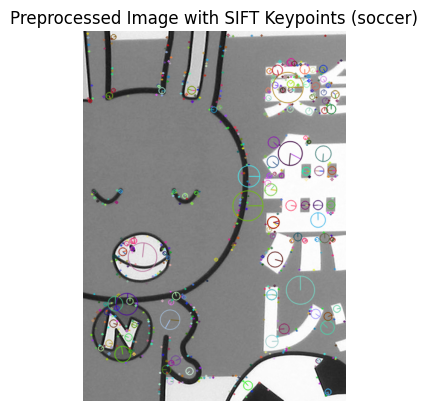

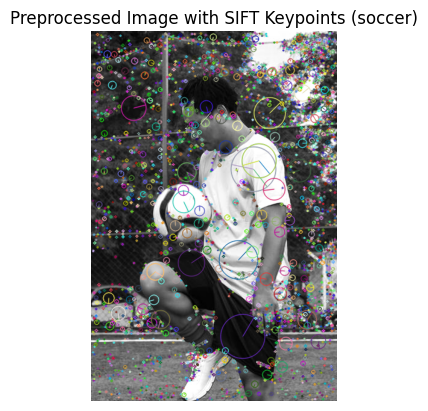

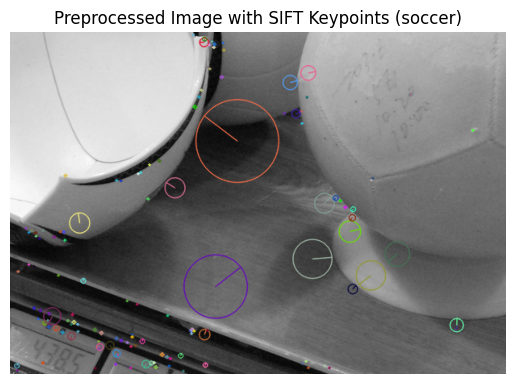

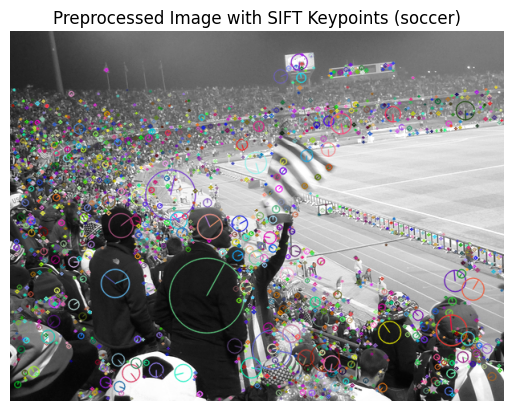

In [21]:
import os
import random
import cv2
import matplotlib.pyplot as plt
from PIL import Image, ImageEnhance

# Initialize SIFT detector
sift = cv2.SIFT_create()

# Function to perform preprocessing on images
def preprocess_image(img):
    # Crop 20% of the image from top, bottom, left, and right
    height, width = img.shape[:2]
    crop_percent = 0.2
    start_y = int(height * crop_percent)
    end_y = int(height * (1 - crop_percent))
    start_x = int(width * crop_percent)
    end_x = int(width * (1 - crop_percent))
    cropped_img = img[start_y:end_y, start_x:end_x]

    # Convert to PIL image
    pil_img = Image.fromarray(cv2.cvtColor(cropped_img, cv2.COLOR_BGR2RGB))

    # Apply contrast enhancement
    enhanced_img = apply_contrast_enhancement(pil_img)

    # Apply brightness enhancement
    enhanced_img = apply_brightness_enhancement(enhanced_img)

    return enhanced_img

# Function to apply contrast enhancement to images
def apply_contrast_enhancement(image):
    enhancer = ImageEnhance.Contrast(image)
    enhanced_img = enhancer.enhance(1.0)
    return enhanced_img

# Function to apply brightness enhancement to an image
def apply_brightness_enhancement(image):
    enhancer = ImageEnhance.Brightness(image)
    enhanced_img = enhancer.enhance(1.1)
    return enhanced_img

# Randomly select 5 images from each category, preprocess them, and apply SIFT
sample_size = 5
for category in CATEGORIES:
    path = os.path.join(DATADIR, category)   # create path to dew, fogsmog, frost, glaze, hail, lightning, rain, rainbow, rime, sandstorm, snow
    image_names = os.listdir(path)

    # Check if there are fewer than 5 images available in the category
    if len(image_names) < sample_size:
        random_images = image_names  # Select all available images
    else:
        random_images = random.sample(image_names, sample_size)  # Select 5 random images from the category

    for img_name in random_images:
        img_path = os.path.join(path, img_name)
        img_array = cv2.imread(img_path)  # convert to array

        # Perform preprocessing on the image
        preprocessed_img = preprocess_image(img_array)

        # Detect keypoints and compute descriptors
        gray = cv2.cvtColor(np.array(preprocessed_img), cv2.COLOR_RGB2GRAY)
        keypoints, descriptors = sift.detectAndCompute(gray, None)

        # Draw keypoints on the image
        img_with_keypoints = cv2.drawKeypoints(gray, keypoints, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

        # Display the preprocessed image with SIFT keypoints
        plt.imshow(img_with_keypoints, cmap='gray')
        plt.title(f'Preprocessed Image with SIFT Keypoints ({category})')
        plt.axis('off')
        plt.show()

Histogram Equalization ( After & Before )

Processing images from category: rugby
Processing images from category: soccer


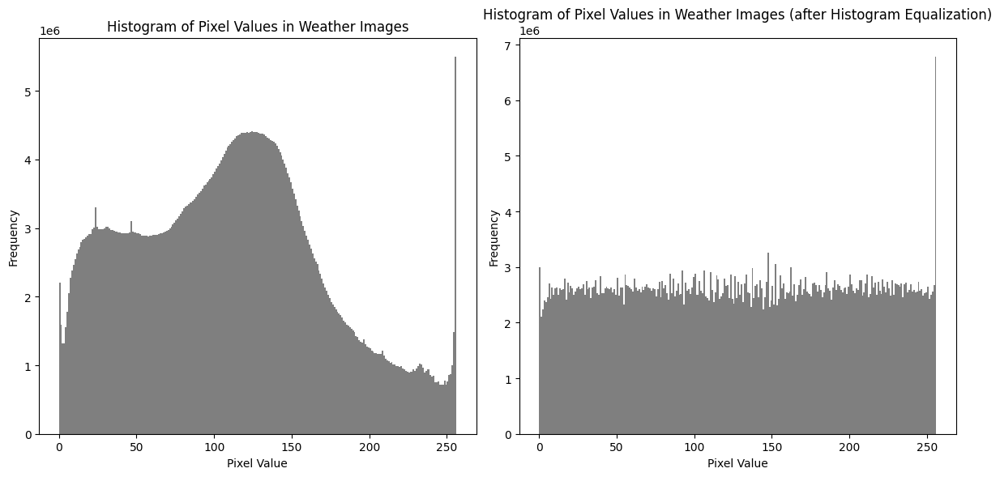

In [22]:
import cv2
import os
import matplotlib.pyplot as plt
import numpy as np

gray_images = []
equalized_images = []

for category in os.listdir(train_dir):
    category_dir = os.path.join(train_dir, category)
    if os.path.isdir(category_dir):
        print('Processing images from category:', category)
        for image_filename in os.listdir(category_dir):
            image_path = os.path.join(category_dir, image_filename)
            # Read the image using OpenCV
            image = cv2.imread(image_path)
            if image is not None:  # Check if the image is successfully read
                # Convert to grayscale
                gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
                # Apply histogram equalization
                image_eq = cv2.equalizeHist(gray_image)
                gray_images.append(gray_image.flatten())  # Add flattened pixel values to list
                equalized_images.append(image_eq.flatten())  # Add flattened pixel values to list
            else:
                print(f"Unable to read image: {image_path}")

# Combine pixel values from all images into a single array
combined_pixels_gray = np.concatenate(gray_images)
combined_pixels_eq = np.concatenate(equalized_images)

# Plot both histograms
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.hist(combined_pixels_gray, bins=256, range=[0, 256], color='k', alpha=0.5)
plt.title('Histogram of Pixel Values in Weather Images')
plt.xlabel('Pixel Value')
plt.ylabel('Frequency')

plt.subplot(1, 2, 2)
plt.hist(combined_pixels_eq, bins=256, range=[0, 256], color='k', alpha=0.5)
plt.title('Histogram of Pixel Values in Weather Images (after Histogram Equalization)')
plt.xlabel('Pixel Value')
plt.ylabel('Frequency')

plt.tight_layout()
plt.show()

PCA

Processing category: rugby
Processing category: soccer


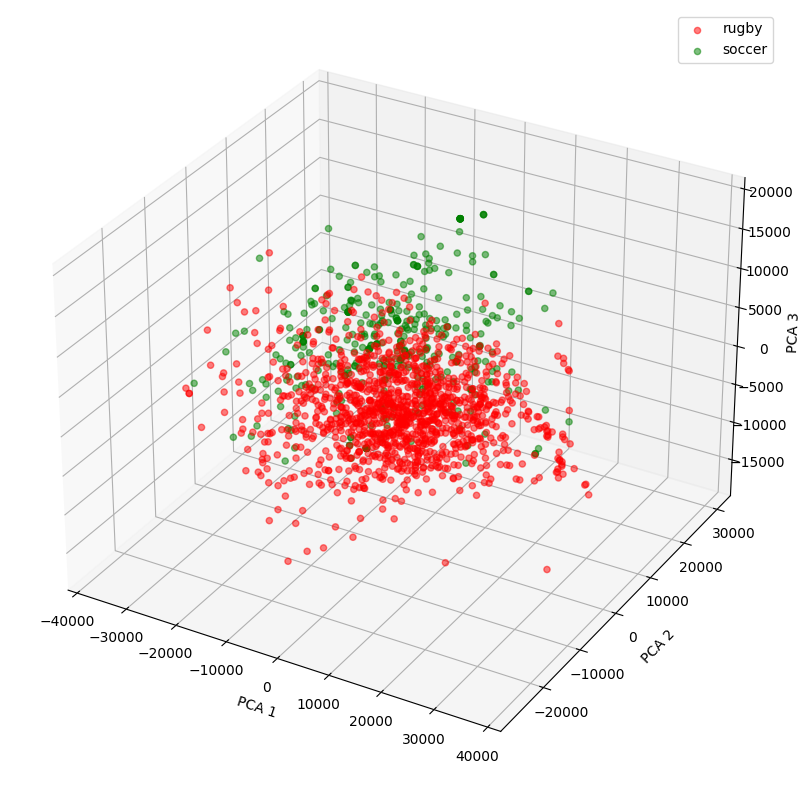

In [24]:
import cv2
import os
import matplotlib.pyplot as plt
import numpy as np
from mpl_toolkits.mplot3d import Axes3D
from sklearn.decomposition import PCA

def show_pca_plot(images, labels):
    # convert images to 1D vectors
    images_flat = images.reshape((len(images), -1))

    # perform PCA to reduce dimensionality
    pca = PCA(n_components=3)
    images_pca = pca.fit_transform(images_flat)

    # plot PCA results
    fig = plt.figure(figsize=(10, 10))
    ax = fig.add_subplot(111, projection='3d')
    colors = ['r', 'g', 'b', 'c', 'm', 'y', 'k']
    for i, label in enumerate(np.unique(labels)):
        idx = np.where(labels == label)[0]
        ax.scatter(images_pca[idx, 0], images_pca[idx, 1], images_pca[idx, 2], c=colors[i], label=label, alpha=0.5)
    ax.set_xlabel('PCA 1')
    ax.set_ylabel('PCA 2')
    ax.set_zlabel('PCA 3')
    ax.legend()
    plt.show()

def adjust_contrast(image, alpha):
    # apply contrast adjustment using alpha value
    new_image = cv2.convertScaleAbs(image, alpha=alpha, beta=0)
    return new_image

def adjust_sharpness(image, beta):
    # apply sharpness adjustment using beta value
    kernel = np.array([[-1,-1,-1], [-1,10,-1], [-1,-1,-1]]) * beta
    new_image = cv2.filter2D(image, -1, kernel)
    return new_image

def adjust_brightness(image, gamma):
    # apply brightness adjustment using gamma value
    inv_gamma = 1.0 / gamma
    table = np.array([((i / 255.0) ** inv_gamma) * 255
                      for i in np.arange(0, 256)]).astype("uint8")
    new_image = cv2.LUT(image, table)
    return new_image

train_dir = "/content/drive/MyDrive/Pattern/train"
resize_shape = (224, 224)  # set the desired size of the images
alpha = 1.5  # set the contrast adjustment factor
beta = 0.5  # set the sharpness adjustment factor
gamma = 1.0  # set the brightness adjustment factor

images = []
labels = []
for i, category in enumerate(os.listdir(train_dir)):
    category_dir = os.path.join(train_dir, category)
    if os.path.isdir(category_dir):
        print('Processing category:', category)
        for image_filename in os.listdir(category_dir):
            image_path = os.path.join(category_dir, image_filename)
            image = cv2.imread(image_path)
            if resize_shape is not None:
                image = cv2.resize(image, resize_shape)
            if category == 'rugby':
                image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # convert to RGB for 'rugby' category

            # apply contrast, sharpness, and brightness adjustments
            image = adjust_contrast(image, alpha)
            image = adjust_sharpness(image, beta)
            image = adjust_brightness(image, gamma)

            images.append(image)
            labels.append(category)

images = np.array(images)
labels = np.array(labels)

show_pca_plot(images, labels)

## Classification

LogisticRegression

In [25]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
from sklearn import metrics
from sklearn.metrics import confusion_matrix

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(images, labels, test_size=0.2, random_state=42)

# Reshape images to 1D vectors
X_train_flat = X_train.reshape((len(X_train), -1))
X_test_flat = X_test.reshape((len(X_test), -1))

# Train Logistic Regression classifier
clf = LogisticRegression(max_iter=1000)
clf.fit(X_train_flat, y_train)

# Predict labels for test set
y_pred = clf.predict(X_test_flat)

# Evaluate accuracy
precision = metrics.accuracy_score(y_pred, y_test) * 100
print("Accuracy with Logistic Regression: {0:.2f}%".format(precision))

# Calculate and print confusion matrix
confusion_matrix_lr = metrics.confusion_matrix(y_test, y_pred)
print("Confusion matrix for Logistic Regression:")
print(confusion_matrix_lr)

Accuracy with Logistic Regression: 96.56%
Confusion matrix for Logistic Regression:
[[242   3]
 [  8  67]]


Decision Tree

In [27]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn import metrics
from sklearn.metrics import confusion_matrix

# convert labels to numerical values
le = LabelEncoder()
y = le.fit_transform(labels)

# split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(images, y, test_size=0.2, random_state=42)

# train a decision tree classifier
clf = DecisionTreeClassifier()
clf.fit(X_train.reshape((len(X_train), -1)), y_train)

# make predictions on the testing set
y_pred = clf.predict(X_test.reshape((len(X_test), -1)))

# evaluate the performance of the classifier
precision = metrics.accuracy_score(y_pred, y_test) * 100
print("Accuracy with Decision Tree: {0:.2f}%".format(precision))

confusion_matrix_dt = metrics.confusion_matrix(y_test, y_pred)
print("Confusion matrix for Decision Tree:")
print(confusion_matrix_dt)

Accuracy with Decision Tree: 85.00%
Confusion matrix for Decision Tree:
[[223  22]
 [ 26  49]]


SVM

In [26]:
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score
from sklearn import metrics
from sklearn.metrics import confusion_matrix
# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(images, labels, test_size=0.2, random_state=42)

# Reshape images to 1D vectors
X_train_flat = X_train.reshape((len(X_train), -1))
X_test_flat = X_test.reshape((len(X_test), -1))

# Train SVM classifier
clf = SVC(kernel='linear', C=1, gamma='auto')
clf.fit(X_train_flat, y_train)

# Predict labels for test set
y_pred = clf.predict(X_test_flat)

# Evaluate accuracy
precision = metrics.accuracy_score(y_pred, y_test) * 100
print("Accuracy with SVM: {0:.2f}%".format(precision))

confusion_matrix_svm = metrics.confusion_matrix(y_test, y_pred)
print("Confusion matrix for SVM:")
print(confusion_matrix_svm)

Accuracy with SVM: 97.50%
Confusion matrix for SVM:
[[243   2]
 [  6  69]]


## confusion matrix

In [28]:
combined_confusion_matrix = np.concatenate((confusion_matrix_svm, confusion_matrix_dt), axis=1)

# Print the combined confusion matrix
print("Combined confusion matrix:")
print(combined_confusion_matrix)

Combined confusion matrix:
[[243   2 223  22]
 [  6  69  26  49]]


## Ensamble

Bagging in Logistic Regression

In [30]:
from sklearn.ensemble import BaggingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder

# convert labels to numerical values
le = LabelEncoder()
y = le.fit_transform(labels)

# split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(images, y, test_size=0.2, random_state=42)

# define the base classifier
base_clf = LogisticRegression()

# define the bagging classifier
clf = BaggingClassifier(base_estimator=base_clf, n_estimators=10, random_state=42)

# train the bagging classifier
clf.fit(X_train.reshape((len(X_train), -1)), y_train)

# make predictions on the testing set
y_pred = clf.predict(X_test.reshape((len(X_test), -1)))

# evaluate the performance of the classifier
accuracy = accuracy_score(y_test, y_pred)
print(' Bagging accuracy:', accuracy)

/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(


 Bagging accuracy: 0.965625


Boosting

In [31]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import AdaBoostClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
from sklearn.preprocessing import LabelEncoder

# convert labels to numerical values
le = LabelEncoder()
y = le.fit_transform(labels)

# split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(images, y, test_size=0.2, random_state=42)

# train a decision tree classifier as base estimator
base_estimator = LogisticRegression()
clf = AdaBoostClassifier(base_estimator=base_estimator, n_estimators=50, random_state=42)
clf.fit(X_train.reshape((len(X_train), -1)), y_train)

# make predictions on the testing set
y_pred = clf.predict(X_test.reshape((len(X_test), -1)))

# evaluate the performance of the classifier
accuracy = accuracy_score(y_test, y_pred)
print('Boosting accuracy:', accuracy)

/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(


Boosting accuracy: 0.9625


## Evaluation

ROC

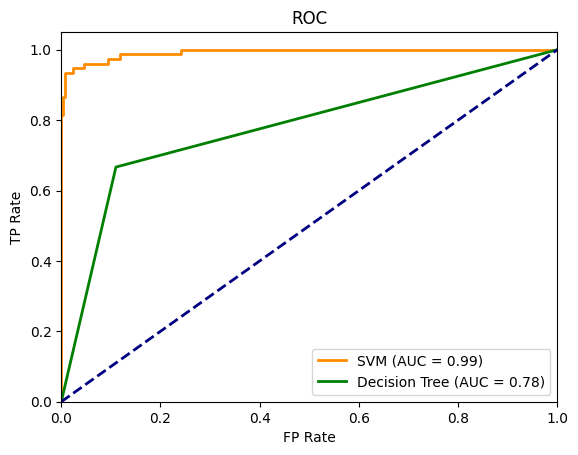

In [35]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc
from sklearn.tree import DecisionTreeClassifier

# Reshape images to 1D vectors
X_train_flat = X_train.reshape((len(X_train), -1))
X_test_flat = X_test.reshape((len(X_test), -1))

# Train SVM classifier
svm_clf = SVC(kernel='linear', C=1, gamma='auto')
svm_clf.fit(X_train_flat, y_train)

# Train tree classifier
tree_clf = DecisionTreeClassifier()
tree_clf.fit(X_train_flat, y_train)

# Predict labels for test set
svm_y_pred = svm_clf.decision_function(X_test_flat)
tree_y_pred = tree_clf.predict_proba(X_test_flat)

# Compute ROC curve and AUC for SVM classifier
fpr_svm, tpr_svm, _ = roc_curve(y_test, svm_y_pred)
roc_auc_svm = auc(fpr_svm, tpr_svm)

# Compute ROC curve and AUC for Decision Tree classifier
tree_fpr, tree_tpr, _ = roc_curve(y_test, tree_y_pred[:,1])
roc_auc_tree = auc(tree_fpr, tree_tpr)

# Plot ROC curves for both classifiers
plt.plot(fpr_svm, tpr_svm, color='darkorange', lw=2, label='SVM (AUC = %0.2f)' % roc_auc_svm)
plt.plot(tree_fpr,tree_tpr, color='green', lw=2, label='Decision Tree (AUC = %0.2f)' % roc_auc_tree)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('FP Rate')
plt.ylabel('TP Rate')
plt.title('ROC')
plt.legend(loc="lower right")
plt.show()

Pretrained Model ( Xception )

In [ ]:
import os
import numpy as np
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator, load_img, img_to_array
from tensorflow.keras.applications import Xception
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score, roc_auc_score, confusion_matrix, roc_curve, auc, classification_report
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from imblearn.over_sampling import SMOTE
import matplotlib.pyplot as plt
from PIL import UnidentifiedImageError  # Import UnidentifiedImageError from PIL

# Define paths
data_path = "/content/drive/MyDrive/Pattern/train"

# Image dimensions and batch size
img_width, img_height = 224, 224
batch_size = 8

# Function to load images and labels
def load_data_from_directory(path):
    images = []
    labels = []
    for label in os.listdir(path):
        label_path = os.path.join(path, label)
        for image_file in os.listdir(label_path):
            image_path = os.path.join(label_path, image_file)
            try:
                image = load_img(image_path, target_size=(img_width, img_height))
                image = img_to_array(image) / 255.0  # Normalize pixel values
                images.append(image)
                labels.append(label)  # Keep label as string
            except (UnidentifiedImageError, OSError):
                print(f"Skipping {image_path} as it cannot be identified as an image.")
    return np.array(images), np.array(labels)

# Load data
X, y = load_data_from_directory(data_path)

# Encode string labels to numerical format
label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(y)

# Split data into training, validation, and test sets
X_train, X_temp, y_train, y_temp = train_test_split(X, y_encoded, test_size=0.3, random_state=42)
X_valid, X_test, y_valid, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=42)

# Apply SMOTE on the training set
smote = SMOTE(random_state=42)
X_train_resampled, y_train_resampled = smote.fit_resample(X_train.reshape(-1, img_width * img_height * 3), y_train)
X_train_resampled = X_train_resampled.reshape(-1, img_width, img_height, 3)

# Data augmentation for the training set with adjusted parameters
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=20,
    width_shift_range=0.1,
    height_shift_range=0.1,
    shear_range=0.1,
    zoom_range=0.1,
    horizontal_flip=True,
    fill_mode='nearest'
)

# Data augmentation for the validation set
valid_datagen = ImageDataGenerator(rescale=1./255)

# Resampled training set generator with shuffle
train_generator = train_datagen.flow(X_train_resampled, y_train_resampled, batch_size=batch_size, shuffle=True)

# Validation set generator
valid_generator = valid_datagen.flow(X_valid, y_valid, batch_size=batch_size, shuffle=False)

# Test set generator
test_datagen = ImageDataGenerator(rescale=1./255)
test_generator = test_datagen.flow(X_test, y_test, batch_size=batch_size, shuffle=False)

# Load pre-trained Xception
base_model = Xception(input_shape=(img_width, img_height, 3), include_top=False, weights='imagenet')

# Unfreeze the last few layers of the base model for fine-tuning
for layer in base_model.layers[-10:]:
    layer.trainable = True

# Build the model with Dropout layer
model = tf.keras.Sequential([
    base_model,
    tf.keras.layers.GlobalAveragePooling2D(),
    tf.keras.layers.Dense(256, activation='relu'),
    tf.keras.layers.Dropout(0.5),  # Added Dropout layer
    tf.keras.layers.Dense(1, activation='sigmoid')
])

# Define the learning rate
custom_learning_rate = 0.0001

# Compile the model with Adam optimizer and adjusted learning rate
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=custom_learning_rate),
              loss='binary_crossentropy',
              metrics=['accuracy'])

# Train the model without early stopping
epochs = 20
history = model.fit(train_generator,
                    steps_per_epoch=len(train_generator),
                    epochs=epochs,
                    validation_data=valid_generator,
                    validation_steps=len(valid_generator),
                    class_weight={0: 1.0, 1: 2.0})

# Evaluate on the test set
y_true = np.concatenate([test_generator[i][1] for i in range(len(test_generator))])
y_pred = model.predict(test_generator)
y_pred_classes = np.round(y_pred)

# Calculate metrics including specificity
conf_matrix = confusion_matrix(y_true, y_pred_classes)
TN, FP, FN, TP = conf_matrix.ravel()
specificity = TN / (TN + FP)

# Print metrics
print("Accuracy:", accuracy_score(y_true, y_pred_classes))
print("F1 Score:", f1_score(y_true, y_pred_classes))
print("Precision:", precision_score(y_true, y_pred_classes))
print("Recall:", recall_score(y_true, y_pred_classes))
print("Specificity:", specificity)
print("ROC AUC:", roc_auc_score(y_true, y_pred))

# ROC Curve
fpr, tpr, thresholds = roc_curve(y_true, y_pred)
roc_auc = auc(fpr, tpr)

# Display ROC Curve
plt.figure(figsize=(8, 8))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = {:.2f})'.format(roc_auc))
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()

# Classification report
class_labels = label_encoder.classes_
print("\nClassification Report:")
print(classification_report(y_true, y_pred_classes, target_names=class_labels))

83683744/83683744 [==============================] - 3s 0us/step
Epoch 1/20
 92/217 [===========>..................] - ETA: 15:18 - loss: 0.6988 - accuracy: 0.6698